- Install mmdetection according to [MMDetection Installation](https://mmdetection.readthedocs.io/en/latest/get_started.html), and put the odam_onestage_fcos.ipynb into mmdetection folder.
- To preserve gradient in the inference process, change all "detach=True" in ./mmdet/models/dense_heads/base_dense_head.py to "detach=False".
- make dir "./checkpoints", download corresponding FCOS weights from [FCOS](https://github.com/open-mmlab/mmdetection/tree/main/configs/fcos) based on the adopted config file, and put it into "./checkpoints".
- make dir "./data", download MS COCO validation dataset and annotation file and put into "./data".

In [1]:
import os
from mmdet.apis import init_detector
import torch
from mmengine.runner import load_checkpoint

from mmdet.utils import get_test_pipeline_cfg
from mmcv.transforms import Compose
from torchvision import transforms
from mmdet.datasets.api_wrappers import COCO

coco = COCO('./data/coco/annotations/instances_val2017.json')

torch.set_grad_enabled(True)

# Set the device to be used for evaluation
device='cuda:0'
fcos_config = "./configs/fcos/fcos_r50-dcn-caffe_fpn_gn-head-center-normbbox-centeronreg-giou_1x_coco.py"
checkpoint = "./checkpoints/fcos_center-normbbox-centeronreg-giou_r50_caffe_fpn_gn-head_dcn_1x_coco-ae4d8b3d.pth"
model = init_detector(fcos_config, checkpoint)
print(dir(model))

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location='cpu')
# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']
# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

loading annotations into memory...
Done (t=0.44s)
creating index...
index created!
Loads checkpoint by local backend from path: ./checkpoints/fcos_center-normbbox-centeronreg-giou_r50_caffe_fpn_gn-head_dcn_1x_coco-ae4d8b3d.pth
['T_destination', '__abstractmethods__', '__annotations__', '__call__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_apply', '_backward_hooks', '_backward_pre_hooks', '_buffers', '_call_impl', '_compiled_call_impl', '_dump_init_info', '_forward', '_forward_hooks', '_forward_hooks_always_called', '_forward_hooks_with_kwargs', '_forward_pre_hooks', '_forward_pre_hooks_with_kwargs', '_get_backward_hooks', '_get_

FCOS(
  (data_preprocessor): DetDataPreprocessor()
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
   

In [2]:
cfg = model.cfg
cfg = cfg.copy()

test_pipeline = get_test_pipeline_cfg(cfg)
print(test_pipeline)
test_pipeline = Compose(test_pipeline)


[{'type': 'LoadImageFromFile', 'backend_args': None}, {'type': 'Resize', 'scale': (1333, 800), 'keep_ratio': True}, {'type': 'LoadAnnotations', 'with_bbox': True}, {'type': 'PackDetInputs', 'meta_keys': ('img_id', 'img_path', 'ori_shape', 'img_shape', 'scale_factor')}]


In [3]:
img_path = './data/coco/val2017/000000079229.jpg' 

filename = os.path.basename(img_path)
img_id = int(filename.split('.')[0])
data_ = dict(img_path=img_path, img_id=img_id)

# build the data pipeline
data_ = test_pipeline(data_)
print("[data_samples:]", data_['data_samples'])
img_shape = data_['data_samples'].img_shape
ori_shape = data_['data_samples'].ori_shape
print("[img shape:]", img_shape)
print("[ori shape:]", ori_shape)

# preprepare data
data_['inputs'] = [data_['inputs']]
data_['data_samples'] = [data_['data_samples']]

data_processor = model.data_preprocessor
input_data = data_processor(data_)
print("[input data shape:]", input_data['inputs'].shape)

# get level features from feature pyramid network
level_features = model.extract_feat(input_data['inputs'])
for level in range(len(level_features)):
    print("[level {} feature shape:]".format(level), level_features[level].shape)
    

batch_img_metas = [
    data_samples.metainfo for data_samples in data_['data_samples']
]
outs = model.bbox_head(level_features)
predictions = model.bbox_head.predict_by_feat(
            *outs, batch_img_metas=batch_img_metas, rescale=True)
print("len of bboxes: ", len(predictions[0].bboxes))
keep = predictions[0].scores>0.3
unselected_bboxes = predictions[0].bboxes
unselected_scores = predictions[0].scores
unselected_labels = predictions[0].labels
predictions = predictions[0][keep]
bboxes = predictions.bboxes
labels = predictions.labels
scores = predictions.scores
obj_labels=labels
print("unselected bboxes:", unselected_bboxes)
print("bboxes:", bboxes)
print("labels:", labels)
print("scores:", scores)

[data_samples:] <DetDataSample(

    META INFORMATION
    img_id: 79229
    scale_factor: (1.878125, 1.8779342723004695)
    img_path: './data/coco/val2017/000000079229.jpg'
    ori_shape: (426, 640)
    img_shape: (800, 1202)

    DATA FIELDS
    gt_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: HorizontalBoxes(
                tensor([], size=(0, 4)))
            labels: tensor([], dtype=torch.int64)
        ) at 0x7f6e6f700670>
    ignored_instances: <InstanceData(
        
            META INFORMATION
        
            DATA FIELDS
            bboxes: HorizontalBoxes(
                tensor([], size=(0, 4)))
            labels: tensor([], dtype=torch.int64)
        ) at 0x7f6e6ff69af0>
) at 0x7f6e6f7004f0>
[img shape:] (800, 1202)
[ori shape:] (426, 640)
[input data shape:] torch.Size([1, 3, 800, 1216])
[level 0 feature shape:] torch.Size([1, 256, 100, 152])
[level 1 feature shape:] torch.Size([1, 256, 50, 76])

/home/visal/chenyzhao9/anaconda3/envs/openmmlab/lib/python3.8/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1708025845899/work/aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


len of bboxes:  26
unselected bboxes: tensor([[328.6982, 119.7937, 382.1282, 280.6128],
        [203.5212, 190.7009, 487.8241, 352.0213],
        [106.1088, 292.0858, 199.8131, 340.4723],
        [106.1088, 292.0858, 199.8131, 340.4723],
        [106.1088, 292.0858, 199.8131, 340.4723],
        [372.9915, 183.2768, 398.1784, 206.4284],
        [106.1088, 292.0858, 199.8131, 340.4723],
        [106.1088, 292.0858, 199.8131, 340.4723],
        [306.3301, 123.7807, 391.9189, 298.2650],
        [106.1088, 292.0858, 199.8131, 340.4723],
        [215.5965, 152.2877, 421.5146, 318.5529],
        [202.2571, 202.4028, 369.0060, 344.7155],
        [257.2559, 123.2414, 386.8490, 290.3126],
        [314.9915, 152.7739, 427.2271, 281.2420],
        [107.3693, 292.6766, 155.7342, 334.8479],
        [203.5212, 190.7009, 487.8241, 352.0213],
        [203.5212, 190.7009, 487.8241, 352.0213],
        [203.5212, 190.7009, 487.8241, 352.0213],
        [346.3508, 150.7592, 354.7181, 164.2739],
        [203

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

CLASSES = model.CLASSES
print(CLASSES)

color = {'green':(0,255,0),
        'blue':(255,165,0),
        'dark red':(0,0,139),
        'red':(0, 0, 255),
        'dark slate blue':(139,61,72),
        'aqua':(255,255,0),
        'brown':(42,42,165),
        'deep pink':(147,20,255),
        'fuchisia':(255,0,255),
        'yello':(0,238,238),
        'orange':(0,165,255),
        'saddle brown':(19,69,139),
        'black':(0,0,0),
        'white':(255,255,255)}

colors = ['green', 'blue', 'dark red', 'red', 'dark slate blue', 'aqua', 'brown',\
        'deep pink', 'fuchisia', 'yello', 'orange', 'saddle brown','white']

def draw_boxes(img, boxes, scores=None, tags=None, line_thick=2, line_color='white'):
    width = img.shape[1]
    height = img.shape[0]
    for i in range(len(boxes)):
        tmp_color=(255,255,255)
        one_box = boxes[i]
        one_box = np.array([max(one_box[0], 0), max(one_box[1], 0),
                    min(one_box[2], width - 1), min(one_box[3], height - 1)])
        x1,y1,x2,y2 = np.array(one_box[:4]).astype(int)
        cv2.rectangle(img, (x1,y1), (x2,y2), tmp_color, line_thick)
        if scores is not None:
            text = "{} {:.3f}".format(CLASSES[tags[i]], scores[i])
            cv2.putText(img, text, (x1, y1 - 7), cv2.FONT_ITALIC, 1.0, tmp_color, line_thick)
    return img

('person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush')


In [5]:
# get gt
ann_ids = coco.get_ann_ids(img_ids=[img_id])
ann_info = coco.load_anns(ann_ids)
gt_bboxes = []

gt_bboxes = torch.tensor([ann['bbox'] for ann in ann_info])
gt_bboxes[:,2:] = gt_bboxes[:,:2] + gt_bboxes[:,2:]

In [6]:
from mmdet.evaluation.functional import bbox_overlaps
dt_bboxes = bboxes.clone().detach().cpu()
overlaps = bbox_overlaps(dt_bboxes[:,:4].numpy(), gt_bboxes.numpy())
overlaps = torch.from_numpy(overlaps)
gt_inds = []
box_inds = []
max_ious = []
for j in range(min(len(dt_bboxes), len(gt_bboxes))):
    # find which proposal box maximally covers each gt box
    # and get the iou amount of coverage for each gt box
    max_overlaps, argmax_overlaps = overlaps.max(dim=0)
    # find which gt box is 'best' covered (i.e. 'best' = most iou)
    gt_ovr, gt_ind = max_overlaps.max(dim=0)            
    if gt_ovr <= 0.5:  # the best covered gt with iou<=0.9
        break
    else:
        max_ious.append(gt_ovr)
        # find the proposal box that covers the best covered gt box
        box_ind = argmax_overlaps[gt_ind]
        # mark the proposal box and the gt box as used
        overlaps[box_ind, :] = -1
        overlaps[:, gt_ind] = -1
        gt_inds.append(gt_ind)
        box_inds.append(box_ind)
        

box_inds = torch.tensor(box_inds).long()
gt_inds = torch.tensor(gt_inds).long()
print(box_inds, gt_inds)


tensor([1, 2, 0]) tensor([1, 0, 2])


In [7]:
overlap = bbox_overlaps(dt_bboxes[box_inds,:4].cpu().numpy(), gt_bboxes[gt_inds].numpy())
overlap = torch.from_numpy(overlap).to(device)

overlap.requires_grad=True

overlap = torch.diag(overlap)


In [8]:
def get_hw(img,boxes):
    h=[]
    w=[]
    for i in range(len(boxes)):
        width = img.shape[1]
        height = img.shape[0]
        
        one_box = boxes[i]
        one_box = np.array([max(one_box[0], 0), max(one_box[1], 0),
                    min(one_box[2], width - 1), min(one_box[3], height - 1)])
        x1,y1,x2,y2 = np.array(one_box[:4]).astype(int)
        h.append(y2-y1)
        w.append(x2-x1)
    return h,w

In [9]:
ori_img = cv2.imread(img_path)
h,w=get_hw(ori_img.copy(),bboxes[box_inds].clone().detach().cpu())

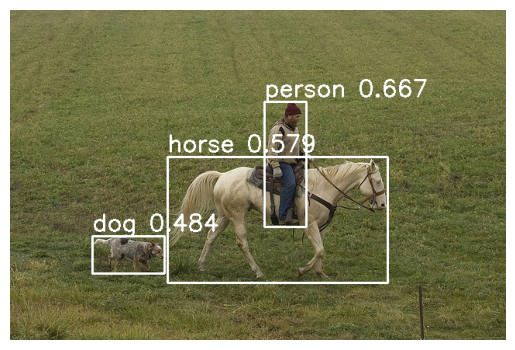

In [10]:
ori_img = cv2.imread(img_path)
img = draw_boxes(ori_img.copy(), bboxes[box_inds].clone().detach().cpu(), scores=scores[box_inds].clone().detach().cpu(), tags=labels[box_inds].clone().detach().cpu())
plt.imshow(img[:,:,::-1])
plt.axis('off')
plt.show()

In [11]:
import math

import torchvision
from PIL import Image
import torch

from torch import nn
import torchvision.transforms as T
import torch.nn.functional as F
Ts = transforms.Resize((int(ori_shape[0]/8), int(ori_shape[1]/8)))
Tl = transforms.Resize(ori_shape)

# ODAM

In [12]:
im_copy = ori_img.copy()
H, W, _ = im_copy.shape
resize = T.Resize((H, W))
odam_maps = torch.zeros((len(box_inds), H, W))
tmp_maps = []

for l, feat in enumerate(level_features):
    feat_maps = [] # level_maps changed to feat_maps

    for cls_score, (xmin, ymin, xmax, ymax) in zip(scores[box_inds], bboxes[box_inds]):
        out1 = xmin
        out2 = ymin
        out3 = -xmax
        out4 = -ymax
        out5 = cls_score

        ### comb
        maps = []
        for out in [out1,out2,out3,out4,out5]:
            grad = torch.autograd.grad(
                    out,
                    feat,
                    retain_graph=True)[0]

                
            
                    
            
            # ODAM
            tmap = F.relu_((grad * feat).sum(1)).detach()
            if tmap.sum() != 0:
                tmap -= tmap.min()
                tmap /= tmap.max()
                
            maps.append(tmap)

        final_map = torch.max(torch.cat(maps, dim=0)* torch.tensor([1,1,1,1,1])[:,None,None].to(tmap.device), dim=0)[0]
        feat_maps.append(resize(final_map.unsqueeze(0)))

    
    odam_maps += torch.cat(feat_maps, dim=0).detach().cpu()  # N,H,W  N: number of boxes


/home/shujun/miniconda3/lib/python3.11/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


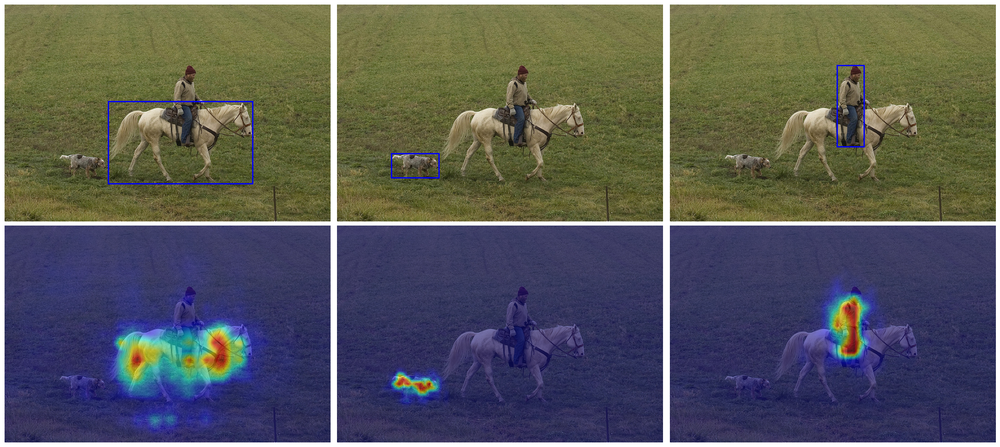

In [13]:
show_num = min(5, len(box_inds)) 
fig, axs = plt.subplots(ncols=show_num, nrows=2, figsize=(22, 10)) 

for j, ax_i, (xmin, ymin, xmax, ymax) in zip(range(show_num), axs.T, bboxes[box_inds]): 
    ax = ax_i[0]
    ax.imshow(im_copy[:,:,::-1])
    ax.add_patch(plt.Rectangle((int(xmin), int(ymin)), int(xmax - xmin), int(ymax - ymin),
                               fill=False, color='blue', linewidth=2))
    ax.axis('off')
    
    
    att = odam_maps[j]
    att -= att.min()
    att /= att.max()
    att = att.numpy()*255.
    color = cv2.applyColorMap(att.astype(np.uint8), cv2.COLORMAP_JET)
    c_ret = np.clip(im_copy * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8) #c_ret: c return
    ax = ax_i[1]
    ax.axis('off')
    ax.imshow(c_ret[:,:,::-1])

fig.tight_layout()



In [15]:
import del_ins_difference_map

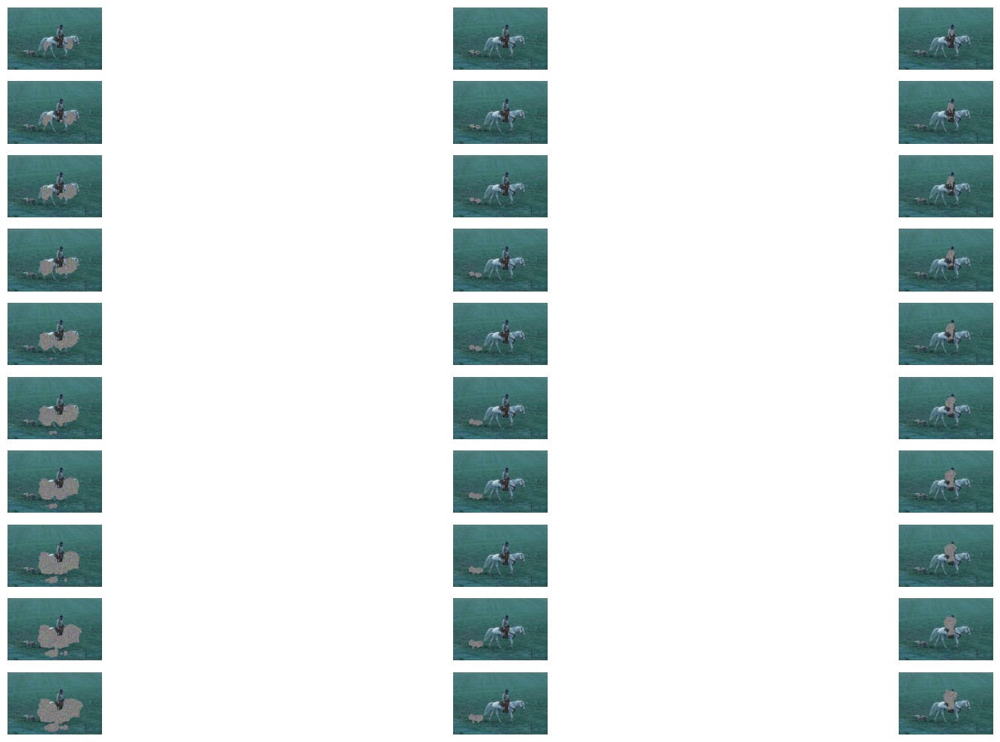

In [16]:
L = 100
gap = 10
ratio=0.93 # change the ratio according to map size and image size
input_img=ori_img.copy()

fig, axs = plt.subplots(ncols=show_num, nrows=10, figsize=(22, 10)) 
for i in range(0, show_nums):
    filename[i]='obj'+str(i)

stepname=['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']

for step in range(10, L+1, gap):
    for j, ax_i in zip(range(show_num), axs.T):
        H=h[j]
        W=w[j]
        area=H*W*ratio
        k=(step-1)//10
        ax = ax_i[k]
        heatmap=diff_map[j]
        del_img = del_ins_difference_map.delection_process(input_img, heatmap, area, L, step)
        filepath="output_difference_map/{}{}.jpg".format(filename[j],stepname[k])
        cv2.imwrite(filepath, del_img.numpy())
        
        ax.axis('off')
        ax.imshow(del_img)

fig.tight_layout()



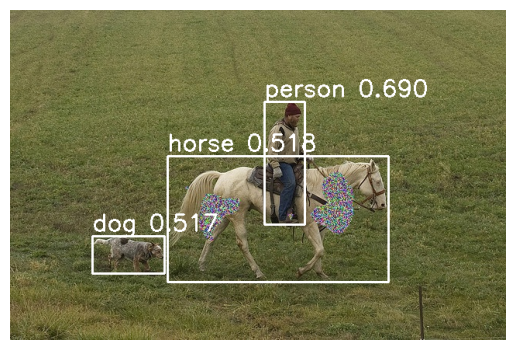

person 0.690
horse 0.518
dog 0.517


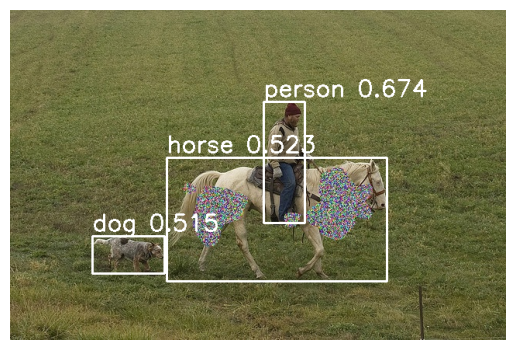

person 0.674
horse 0.523
dog 0.515


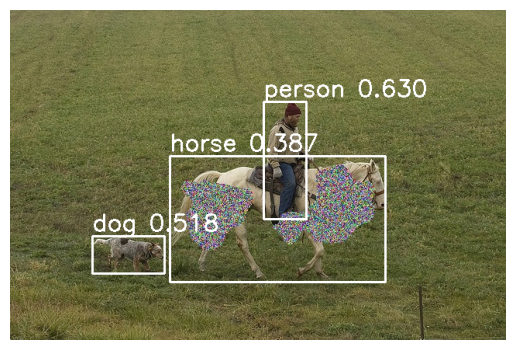

person 0.630
dog 0.518
horse 0.387


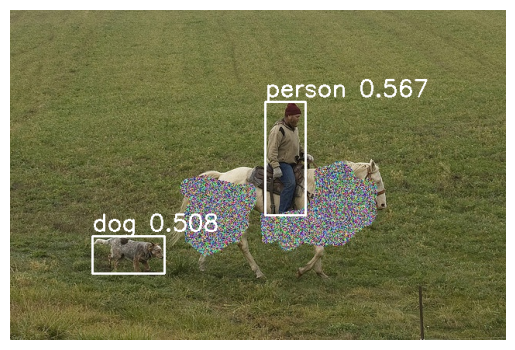

person 0.567
dog 0.508


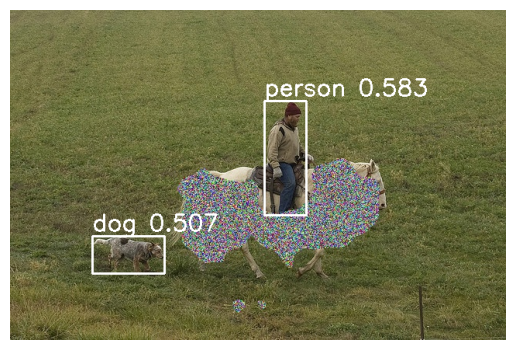

person 0.583
dog 0.507


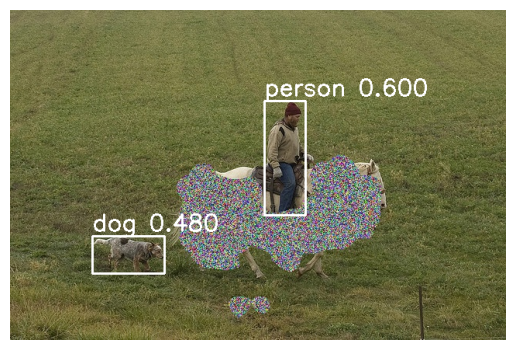

person 0.600
dog 0.480


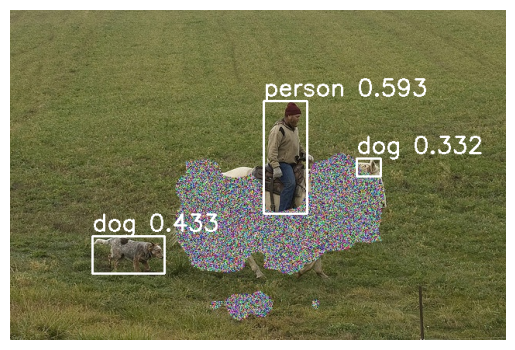

person 0.593
dog 0.433
dog 0.332


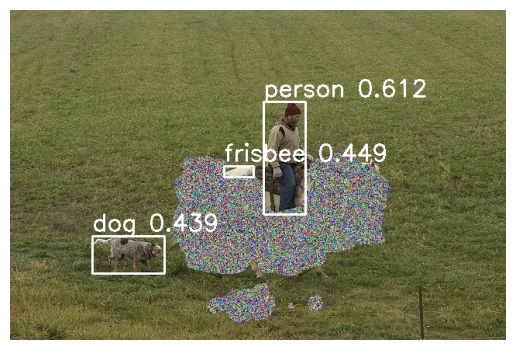

person 0.612
frisbee 0.449
dog 0.439


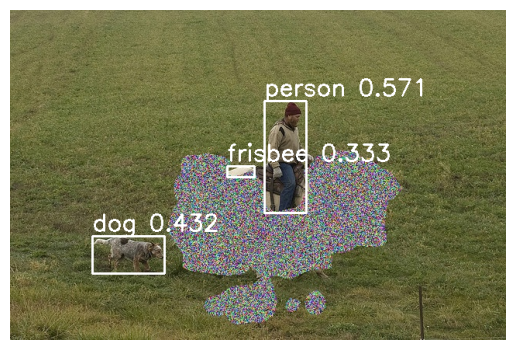

person 0.571
dog 0.432
frisbee 0.333


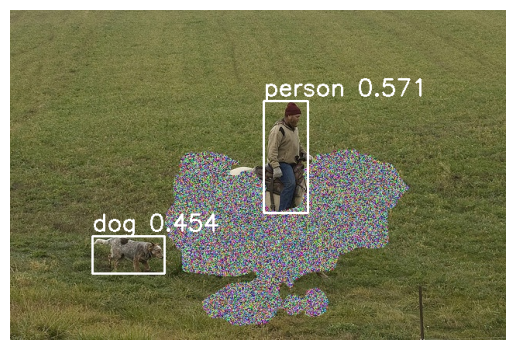

person 0.571
dog 0.454




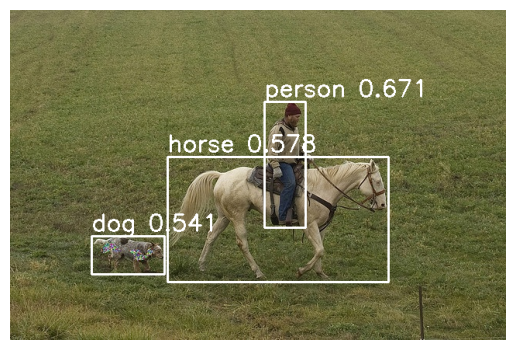

person 0.671
horse 0.578
dog 0.541


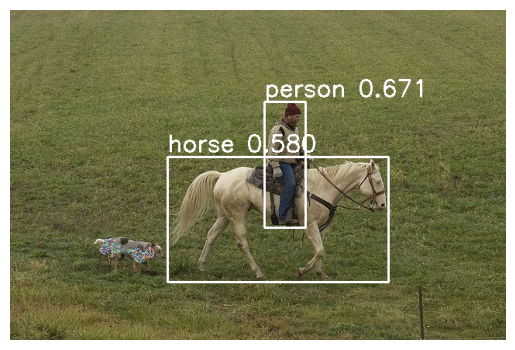

person 0.671
horse 0.580


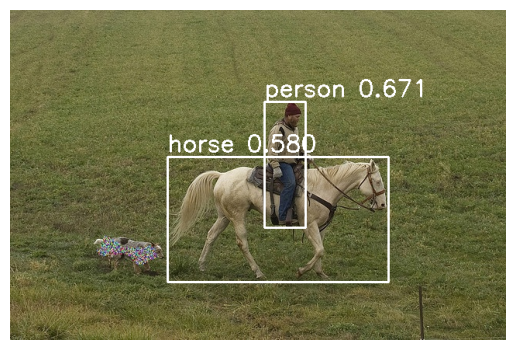

person 0.671
horse 0.580


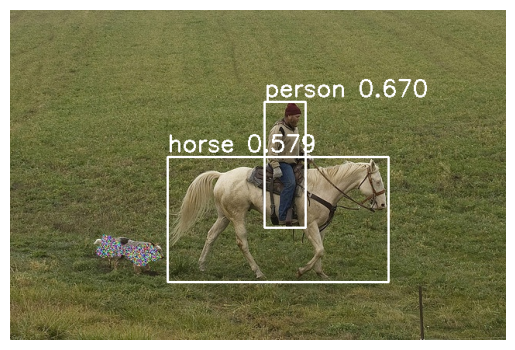

person 0.670
horse 0.579


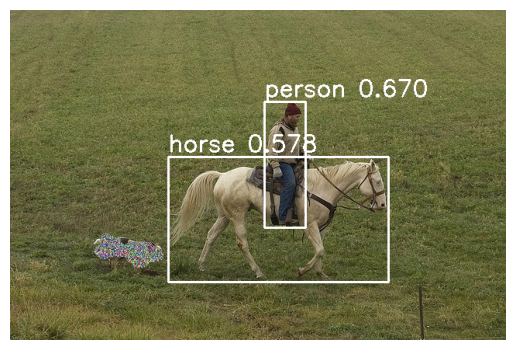

person 0.670
horse 0.578


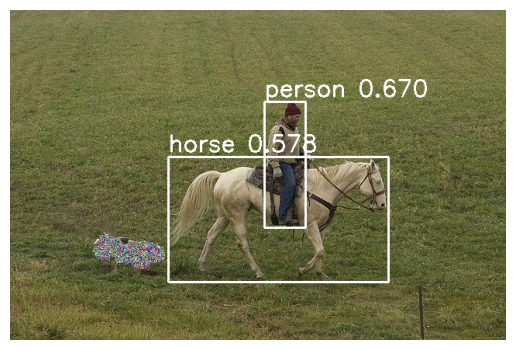

person 0.670
horse 0.578


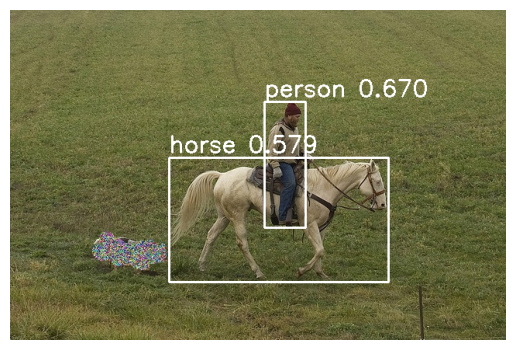

person 0.670
horse 0.579


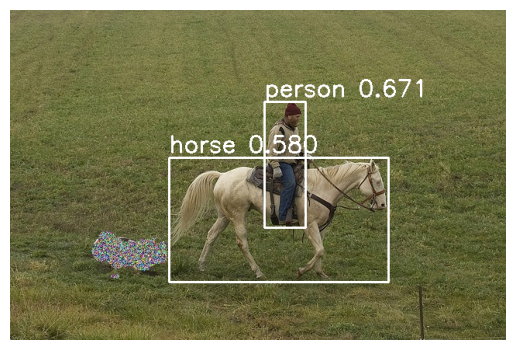

person 0.671
horse 0.580


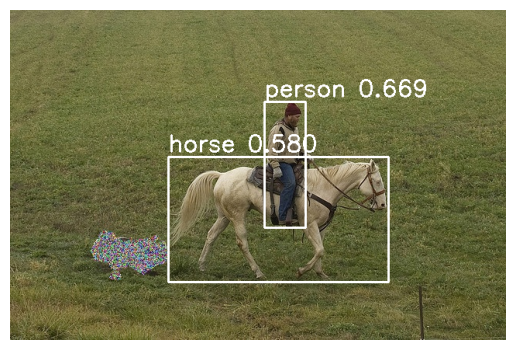

person 0.669
horse 0.580


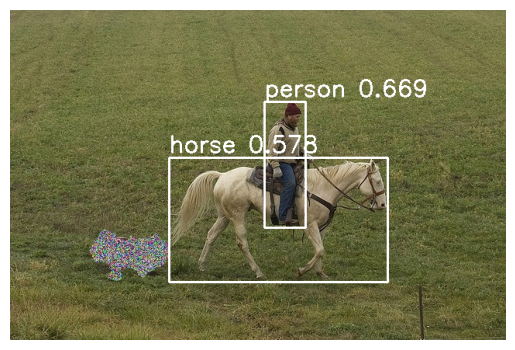

person 0.669
horse 0.578




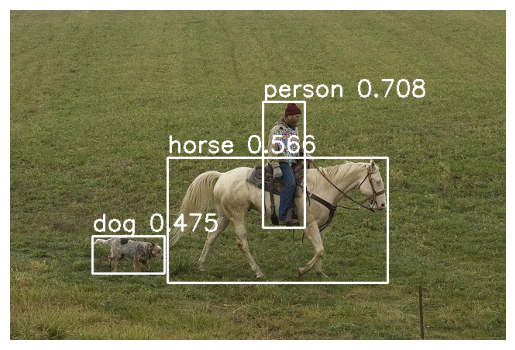

person 0.708
horse 0.566
dog 0.475


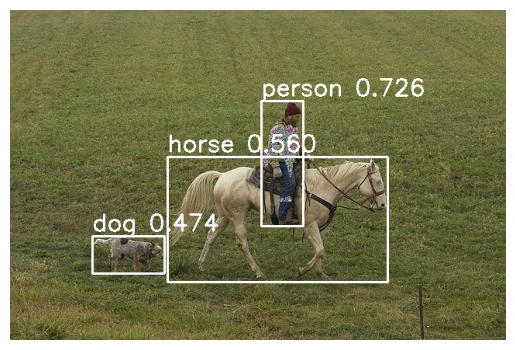

person 0.726
horse 0.560
dog 0.474


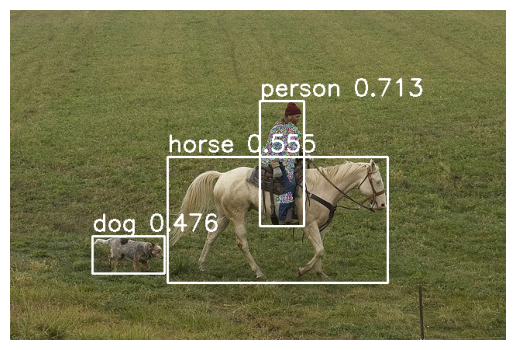

person 0.713
horse 0.555
dog 0.476


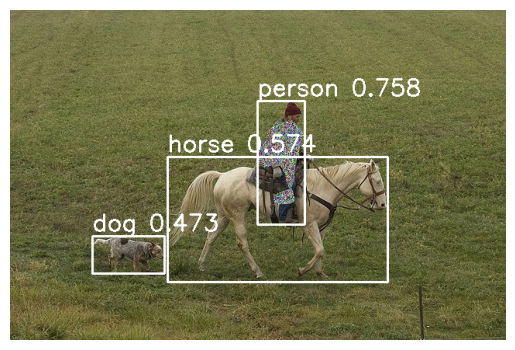

person 0.758
horse 0.574
dog 0.473


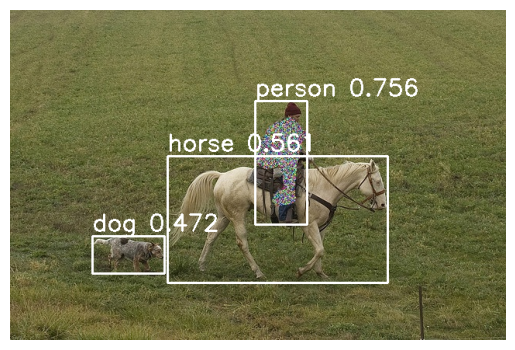

person 0.756
horse 0.561
dog 0.472


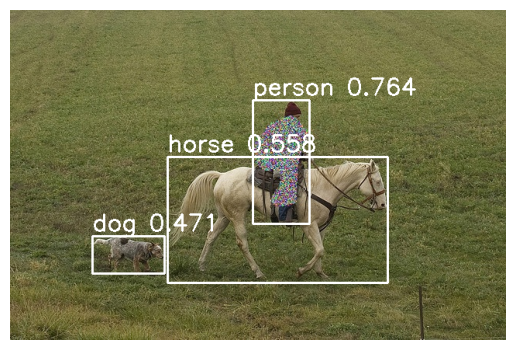

person 0.764
horse 0.558
dog 0.471


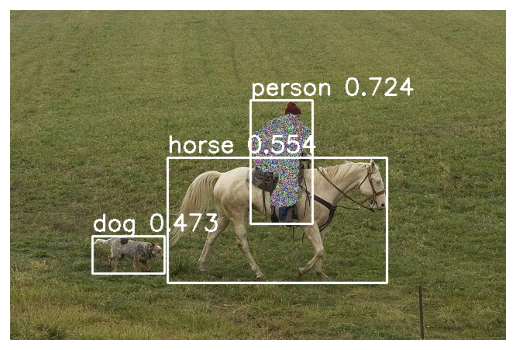

person 0.724
horse 0.554
dog 0.473


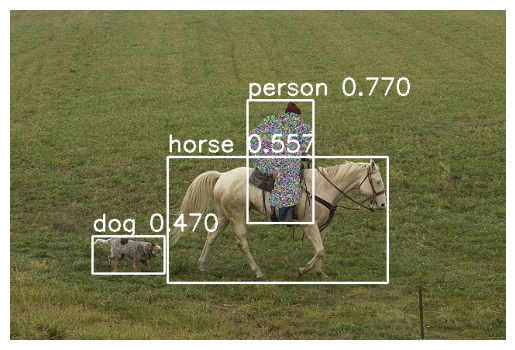

person 0.770
horse 0.557
dog 0.470


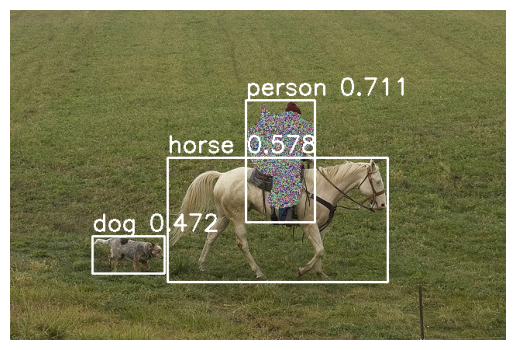

person 0.711
horse 0.578
dog 0.472


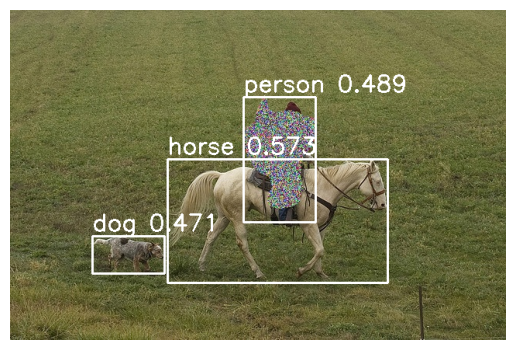

horse 0.573
person 0.489
dog 0.471




In [17]:
for i in range(show_nums):
    for j in range(10):
        img_path="output_difference_map/{}{}.jpg".format(filename[i],stepname[j])
        data_ = dict(img_path=img_path, img_id=139)
        data_ = test_pipeline(data_)
        data_['inputs'] = [data_['inputs']]
        data_['data_samples'] = [data_['data_samples']]
        data_processor = model.data_preprocessor
        input_data = data_processor(data_)
        level_features = model.extract_feat(input_data['inputs'])
        batch_img_metas = [
            data_samples.metainfo for data_samples in data_['data_samples']
        ]
        outs = model.bbox_head(level_features)
        predictions = model.bbox_head.predict_by_feat(
                    *outs, batch_img_metas=batch_img_metas, rescale=True)
        keep = predictions[0].scores>0.3
        unselected_bboxes = predictions[0].bboxes
        predictions = predictions[0][keep]
        bboxes = predictions.bboxes
        labels = predictions.labels
        scores = predictions.scores
        ori_img = cv2.imread(img_path)
        img = draw_boxes(ori_img.copy(), bboxes.clone().detach().cpu(), scores=scores.clone().detach().cpu(), tags=labels.clone().detach().cpu(),line_thick=2,line_color='white')
        plt.imshow(img[:,:,::-1])
        plt.axis('off')
        plt.show() 
        scores=scores.clone().detach().cpu()
        tags=labels.clone().detach().cpu()
        for k in range(len(bboxes)):
            if scores is not None:
                text = "{} {:.3f}".format(CLASSES[tags[k]], scores[k])
                print(text)
        if (j==9):
            print('\n')